# Trabajo Práctico Final - Grupo 2
## Matías Bergerman, Pablo González Leiro, Tobias Demeco, Matías Tripoli

Set up (Windows cmd)

1. Crear un entorno virtual (recomendado) e instalar las librerías necesarias:

    `python -m venv venv`

    `.\venv\Scripts\activate`

    `pip install -r ".\TP final - PCB Defect Detection\requirements.txt"`

2. Bajar el token para la API de Kaggle (https://www.kaggle.com/docs/api). Luego bajar la base de datos (1.88GB):

    `cd "TP final - PCB Defect Detection"`

    `kaggle datasets download -d akhatova/pcb-defects`

    `tar -xf pcb-defects.zip`

    `del pcb-defects.zip`

In [1]:
# Import Libraries

import os
import numpy as np
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import cv2
from PIL import Image

import pandas as pd
import xml.etree.ElementTree as ET 

## Visualización

#### In-line Display

In [2]:
def display_np(x, scale = 1.0, resampling = Image.Resampling.BICUBIC):
    im = Image.fromarray(x.clip(0, 255).astype(np.uint8))
    display(im.resize((np.array(im.size)*scale).astype(int), resampling))
    
def display_np_row(x, scale = 1.0, resampling = Image.Resampling.BICUBIC, spacer_width = 0, spacer_grayscale = 0):
    img = np.array(x, dtype=np.uint8)
    if len(img.shape) <= 3:
        spacer = np.ones((img[0].shape[0], spacer_width), dtype=np.uint8) * spacer_grayscale
    else:
        spacer = np.ones((img[0].shape[0], spacer_width, img[0].shape[2]), dtype=np.uint8) * spacer_grayscale
        
    img_combined = img[0]
    for i in range(1, len(img)):
        img_combined = np.concatenate((img_combined, spacer, img[i]), axis=1)
    display_np(img_combined, scale, resampling)

#### Histogram

In [3]:
def img_histogram(x, ignore_black = False):
    y = np.zeros(256)
    for val in x.flatten().astype(np.uint8):
        y[val] += 1
    if ignore_black:
        result = [0] + y[1:] 
        result /= np.size(x) - y[0]
    else:
        result = y / np.size(x)
    return result

def equalize_histogram(x, ignore_black = False):
    hsum = np.cumsum(img_histogram(x, ignore_black))
    map_level = np.vectorize(lambda p: hsum[p]*255)
    return np.clip(map_level(x), 0, 255).astype(np.uint8)

#### K-Means Clustering

In [4]:
def kmeans_cluster(img, k):
    # reshape the image to a 2D array of pixels and 3 color values (RGB)
    pixel_values = img.reshape((-1, 3))
    # convert to float
    pixel_values = np.float32(pixel_values)

    # define stopping criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    # number of clusters (K)
    _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # convert back to 8 bit values
    centers = np.uint8(centers)
    # flatten the labels array
    labels = labels.flatten()
    # convert all pixels to the color of the centroids
    segmented_image = centers[labels.flatten()]
    # reshape back to the original image dimension
    segmented_image = segmented_image.reshape(img.shape)

    return segmented_image, labels

def kmeans_disable_clusters(img, labels, k, clusters):
    masked_image = np.copy(img)
    # convert to the shape of a vector of pixel values
    masked_image = masked_image.reshape((-1, 3))
    # color (i.e cluster) to disable
    for cluster in range(k):
        # disable the cluster number (turn the pixel into black)
        if cluster not in clusters:
            masked_image[labels == cluster] = [0, 0, 0]
            
    # convert back to original shape
    masked_image = masked_image.reshape(img.shape)

    return masked_image

#### Constrast

In [5]:
def imadjust(x,a,b,c,d,gamma=1):
    return (((x - a) / (b - a)) ** gamma) * (d - c) + c

def stretch_contrast(x, low_in=0.01, high_in=0.99, low_out=0.0, high_out=1.0):
    # low_in, low_out = r1, s1
    # high_in, high_out = r2, s2
    r1, r2, s1, s2 = 255*low_in, 255*high_in, 255*low_out, 255*high_out

    def T(r):
        if r < r1:
            return imadjust(r, 0, r1, 0, s1)
        elif r < r2:
            return imadjust(r, r1, r2, s1, s2)
        else:
            return imadjust(r, r2, 255, s2, 255)

    vT = np.vectorize(T)
    
    return vT(x).astype(np.uint8)

### Load Test images

In [6]:
# Open Test Image

path_used ="./PCB_DATASET/PCB_USED/"
path_db ="./PCB_DATASET/images/"

img_pcb = cv2.imread(path_db+'Open_circuit/10_open_circuit_01.jpg')
hsv_pcb =  cv2.cvtColor(img_pcb, cv2.COLOR_RGB2HSV)

#### K-means clustering algorithm test

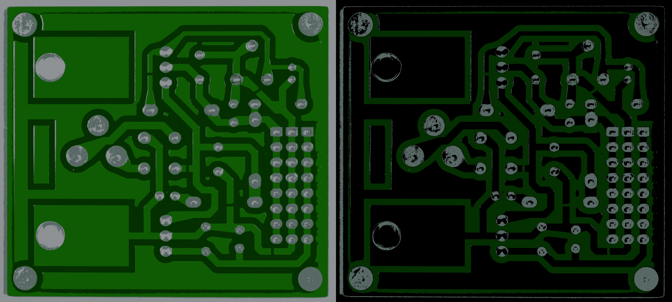

In [30]:
k = 4
pcb_cluster, labels =  kmeans_cluster(img_pcb, k)
pcb_cluster_2 = kmeans_disable_clusters(pcb_cluster, labels, k, [0, 1])

display_np_row([pcb_cluster, pcb_cluster_2], 0.15 )

### Open-circuit detection

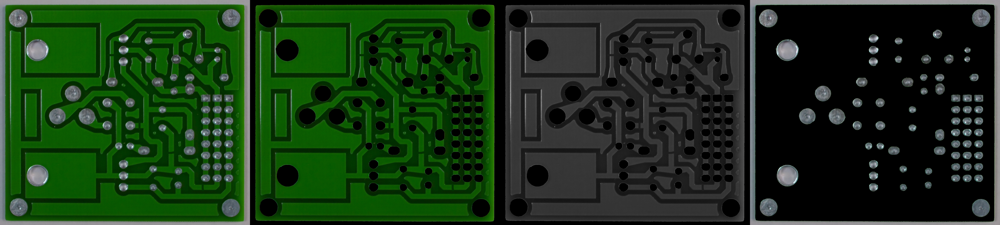

In [40]:
light_green = (30, 120, 0)
dark_green = (80, 255, 255)

mask_silk = cv2.inRange(hsv_pcb, light_green, dark_green)
mask_pad = cv2.inRange(hsv_pcb, light_green, dark_green)

# Correct for reflections and small glitches
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(20,20))
mask_pad  = cv2.dilate(mask_pad, kernel)
mask_pad  = cv2.erode(mask_pad, kernel)

pcb_silk = cv2.bitwise_and(img_pcb, img_pcb, mask=mask_pad)
pcb_pad = cv2.bitwise_and(img_pcb, img_pcb, mask=cv2.bitwise_not(mask_pad))

pcb_silk_gray = cv2.cvtColor(pcb_silk, cv2.COLOR_BGR2GRAY)


display_np_row([img_pcb, pcb_silk, cv2.cvtColor(pcb_silk_gray, cv2.COLOR_GRAY2BGR), pcb_pad])

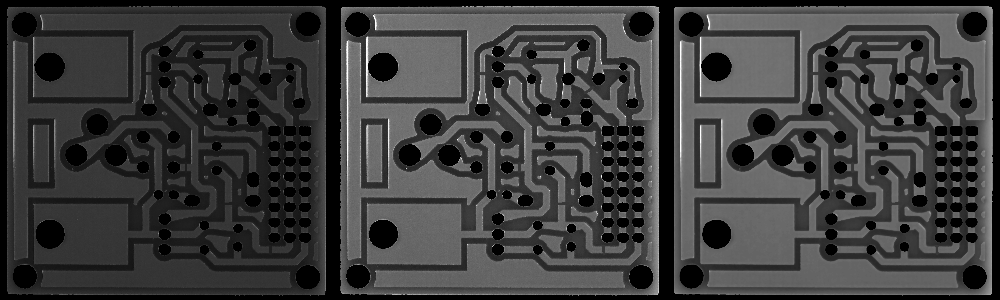

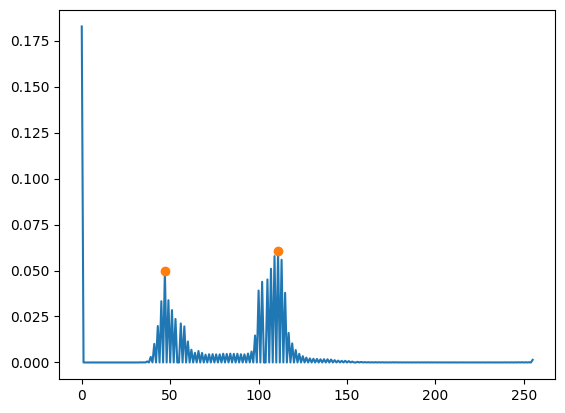

In [55]:
pcb_silk_constrast = stretch_contrast(pcb_silk_gray, low_in=0.01, high_in=0.5, low_out=0.0, high_out=1.0)
pcb_silk_smooth = cv2.medianBlur(pcb_silk_constrast, 11)

display_np_row([pcb_silk_gray, pcb_silk_constrast, pcb_silk_smooth])

hist = img_histogram(pcb_silk_smooth)

plt.plot(hist)
peaks,_ = find_peaks(hist, distance = 25, prominence = 0.01)
plt.plot(peaks, [hist[i] for i in peaks], 'o')
plt.show()

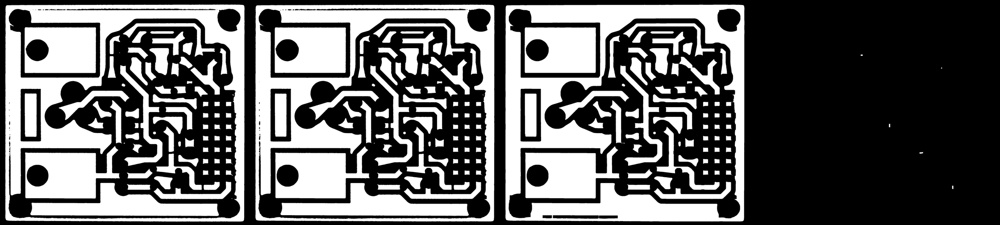

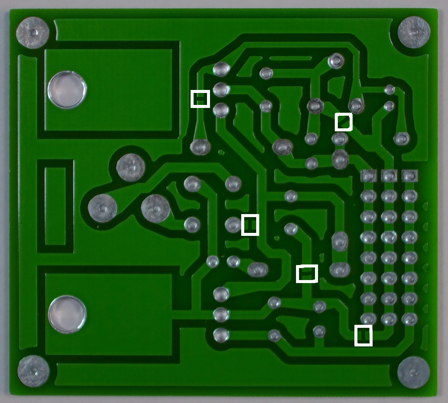

In [59]:
# Outer border to ignore when detecting errors (in pixels)
outer_border = 120

pcb_binary = cv2.threshold(pcb_silk_smooth, (peaks[0]+peaks[1])/2, 255, cv2.THRESH_BINARY)[1]

kernel = np.ones((3, 3), dtype=np.uint8)
img_eroded  = cv2.erode(pcb_binary, kernel)

kernel = np.ones((25, 25), dtype=np.uint8)
img2  = cv2.dilate(img_eroded, kernel)
img2  = cv2.erode(img2, kernel)

kernel = np.ones((10, 10), dtype=np.uint8)
img3  = cv2.erode(img2-img_eroded, kernel)

inner_mask = np.zeros_like(img3)
inner_mask[outer_border:inner_mask.shape[0]-outer_border,outer_border:inner_mask.shape[1]-outer_border] = True
img3 = img3 * inner_mask

kernel1 = np.ones((80, 80), dtype=np.uint8)
kernel2 = np.ones((50, 50), dtype=np.uint8)
img_markers = cv2.cvtColor(cv2.dilate(img3, kernel1) - cv2.dilate(img3, kernel2), cv2.COLOR_GRAY2BGR)

img_markers = cv2.addWeighted(img_pcb, 1.0, img_markers, 1.0, 0)

display_np_row([pcb_binary, img_eroded, img2, img3], 0.25)
display_np(img_markers, 0.2)

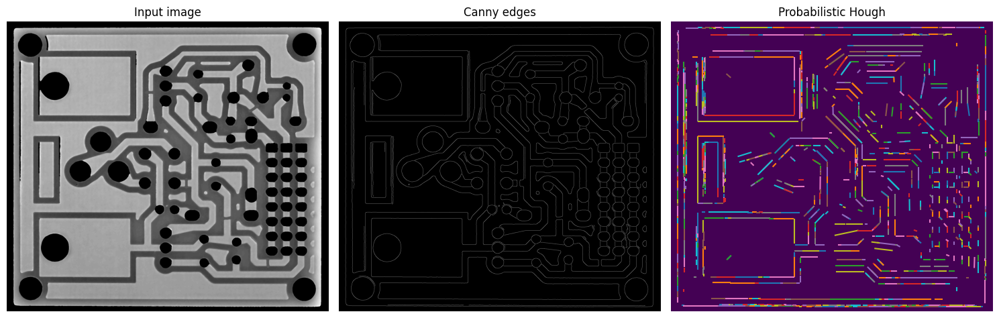

In [28]:
from skimage.transform import probabilistic_hough_line
from skimage.feature import canny
from matplotlib import cm


# Line finding using the Probabilistic Hough Transform
image = pcb_silk_smooth
edges = canny(image, 2, 1, 25)
lines = probabilistic_hough_line(edges, threshold=100, line_length=10,
                                 line_gap=5)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(edges * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

## Abrir las anotaciones

In [11]:
path_an = "./PCB_DATASET/Annotations"
print(path_an)

./PCB_DATASET/Annotations


In [12]:
dataset = {
            "xmin":[],
            "ymin":[],   
            "xmax":[],
            "ymax":[],
            "class":[],    
            "file":[],
            "width":[],
            "height":[],
           }
all_files = []
for path, subdirs, files in os.walk(path_an):
#     print([path, subdirs, files])
    for name in files:
        all_files.append(os.path.join(path, name))

# print(all_files)       
print(type(dataset))
print(dataset)

<class 'dict'>
{'xmin': [], 'ymin': [], 'xmax': [], 'ymax': [], 'class': [], 'file': [], 'width': [], 'height': []}


In [13]:
for annotation in all_files:
    # print(anno)
    tree = ET.parse(annotation)
    
    for elem in tree.iter():
        # print(elem)
        
        if 'size' in elem.tag:
            # print('[size] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):
                if 'width' in attr.tag: 
                    width = int(round(float(attr.text)))
                if 'height' in attr.tag:
                    height = int(round(float(attr.text)))    

        if 'object' in elem.tag:
            # print('[object] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):
                
                # print('attr = %s\n' % attr)
                if 'name' in attr.tag:
                    name = attr.text                 
                    dataset['class']+=[name]
                    dataset['width']+=[width]
                    dataset['height']+=[height] 
                    dataset['file']+=[annotation.split('/')[-1][0:-4]] 
                            
                if 'bndbox' in attr.tag:
                    for dim in list(attr):
                        if 'xmin' in dim.tag:
                            xmin = int(round(float(dim.text)))
                            dataset['xmin']+=[xmin]
                        if 'ymin' in dim.tag:
                            ymin = int(round(float(dim.text)))
                            dataset['ymin']+=[ymin]                                
                        if 'xmax' in dim.tag:
                            xmax = int(round(float(dim.text)))
                            dataset['xmax']+=[xmax]                                
                        if 'ymax' in dim.tag:
                            ymax = int(round(float(dim.text)))
                            dataset['ymax']+=[ymax]         

In [14]:
data=pd.DataFrame(dataset)
data

,xmin,ymin,xmax,ymax,class,file,width,height
0,2459,1274,2530,1329,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586
1,1613,334,1679,396,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586
2,1726,794,1797,854,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586
3,2584,232,2650,298,missing_hole,Annotations\Missing_hole\01_missing_hole_02,3034,1586
4,2366,803,2406,860,missing_hole,Annotations\Missing_hole\01_missing_hole_02,3034,1586
...,...,...,...,...,...,...,...,...
2948,1777,334,1831,426,spurious_copper,Annotations\Spurious_copper\12_spurious_copper_10,2529,2530
2949,1395,935,1457,992,spurious_copper,Annotations\Spurious_copper\12_spurious_copper_10,2529,2530
2950,1837,1441,1871,1530,spurious_copper,Annotations\Spurious_copper\12_spurious_copper_10,2529,2530
2951,1078,1854,1171,1901,spurious_copper,Annotations\Spurious_copper\12_spurious_copper_10,2529,2530
